# Public Space Arrest Data
This notebook includes an exploration of arrest data in the City of LA between 2010 and 2019. Exploring this data is a first step for our project examining the reclamation of public space and neighborhood change/gentrification. In this notebook I completed an initial exploration of the arrest data within six of the neighborhoods we are investigating for our project. 
- Filtered the arrest data to include arrest types we determined were related to "unsanctioned" use of public space
- Filtered the data to just include these arrests in Boyle Heights, Lincoln Heights, Fairfax, Jefferson Park, Los Feliz, and Westlake
- Visualized the arrests in those three neighborhoods by year between 2010 and 2019
- Mapped the arrests by year, charge description, and neighborhood

In [1]:
import pandas as pd
import geopandas as gpd

import plotly.express as px
import plotly.subplots as sp

from sodapy import Socrata

import requests

import numpy as np

import matplotlib.pyplot as plt

import contextily as ctx


## Created a list of arrest types of interest to our project

In [2]:
arrest_types = ["OPEN ALCOHOLIC BEV IN PUBLIC PARK/PLACE", 
                "PLAY BALL/GAMES IN STREET OR PARK", 
                "RECKLESS DRIVING", 
                "IMPEDING NORMAL FLOW OF TRAFFIC", 
                "ILLEGAL STREET/SIDEWALK SALES", 
                "ILLEGAL SALES - FREEWAY RAMPS",
                "SOLICIT SIDEWALK",
                "STREET-SOLICITING EMPLY OF SERVICE",
                "DRINKING IN PUBLIC"]
arrest_types

['OPEN ALCOHOLIC BEV IN PUBLIC PARK/PLACE',
 'PLAY BALL/GAMES IN STREET OR PARK',
 'RECKLESS DRIVING',
 'IMPEDING NORMAL FLOW OF TRAFFIC',
 'ILLEGAL STREET/SIDEWALK SALES',
 'ILLEGAL SALES - FREEWAY RAMPS',
 'SOLICIT SIDEWALK',
 'STREET-SOLICITING EMPLY OF SERVICE',
 'DRINKING IN PUBLIC']

Output shows a list of the arrest types we are trying to isolate

## Imported the arrest data for the selected arrest types into a data frame from the City of LA API

Pulled the data into the notebook from the LA City data hub using a query

In [3]:
url = "https://data.lacity.org/resource/yru6-6re4.json?$limit=100000"

In [4]:
query_params = {'$where': 'chrg_desc in ("{}")'.format('","'.join(arrest_types))}

In [5]:
response = requests.get(url, params=query_params)

In [6]:
response

<Response [200]>

Checked that the query worked with this response call, the 200 revealed it did work without error

Created a dataframe with the data and printed the first 5 rows of the data to examine what the records look like

In [7]:
arrest_df = pd.DataFrame.from_dict(response.json())
arrest_df.head()

,rpt_id,report_type,arst_date,time,area,area_desc,rd,age,sex_cd,descent_cd,...,dispo_desc,location,lat,lon,location_1,crsst,bkg_date,bkg_time,bgk_location,bkg_loc_cd
0,090712341,RFC,2011-03-10T00:00:00.000,0940,07,Wilshire,0776,45,M,B,...,MISDEMEANOR COMPLAINT FILED,4500 W WASHINGTON BL,34.0399,-118.3375,"{'type': 'Point', 'coordinates': [-118.3375, 3...",NaN,NaN,NaN,NaN,NaN
1,100409711,RFC,2010-05-08T00:00:00.000,2135,04,Hollenbeck,0412,20,M,H,...,MISDEMEANOR COMPLAINT FILED,AVENUE 33,34.0838,-118.2166,"{'type': 'Point', 'coordinates': [-118.2166, 3...",ARTESIAN,NaN,NaN,NaN,NaN
2,100409916,RFC,2010-05-12T00:00:00.000,1815,04,Hollenbeck,0459,29,M,H,...,MISDEMEANOR COMPLAINT FILED,3000 FOLSOM ST,34.0449,-118.1996,"{'type': 'Point', 'coordinates': [-118.1996, 3...",NaN,NaN,NaN,NaN,NaN
3,100409918,RFC,2010-05-12T00:00:00.000,1815,04,Hollenbeck,0459,21,M,H,...,MISDEMEANOR COMPLAINT FILED,3000 FOLSOM ST,34.0449,-118.1996,"{'type': 'Point', 'coordinates': [-118.1996, 3...",NaN,NaN,NaN,NaN,NaN
4,100409919,RFC,2010-05-12T00:00:00.000,1815,04,Hollenbeck,0459,44,M,H,...,MISDEMEANOR COMPLAINT FILED,3000 FOLSOM ST,34.0449,-118.1996,"{'type': 'Point', 'coordinates': [-118.1996, 3...",NaN,NaN,NaN,NaN,NaN


The data looks good but has a lot of rows which are not relevant that we might want to remove later. 

Continuted to explore the data by looking at how many values there are of each charge type.

In [8]:
arrest_df['chrg_desc'].value_counts()

DRINKING IN PUBLIC                         93916
ILLEGAL STREET/SIDEWALK SALES               4228
OPEN ALCOHOLIC BEV IN PUBLIC PARK/PLACE     1848
ILLEGAL SALES - FREEWAY RAMPS                  6
IMPEDING NORMAL FLOW OF TRAFFIC                2
Name: chrg_desc, dtype: int64

By far, the most data records are for drinking in public, followed by street vending.

### Added a column for year

Used the to_datetime function in Pandas to create a column that just has year (as opposed to the full arrest date)

In [9]:
arrest_df['arst_date'] = pd.to_datetime(arrest_df['arst_date'])

In [10]:
arrest_df['Year'] = arrest_df['arst_date'].dt.year

### Created a new dataframe with limited columns

Printed out all the columns to see which are important to keep and which can be deleted.

In [11]:
for col in arrest_df.columns:
    print(col)

rpt_id
report_type
arst_date
time
area
area_desc
rd
age
sex_cd
descent_cd
chrg_grp_cd
grp_description
arst_typ_cd
charge
chrg_desc
dispo_desc
location
lat
lon
location_1
crsst
bkg_date
bkg_time
bgk_location
bkg_loc_cd
Year


Based on the above output, picked the relevent columns to keep and create a list of them and redefined the arrest_df dataframe to just contain those identifed columns. 

In [12]:
columns_to_keep = ['arst_date', 'rd', 'chrg_desc', 'location_1', 'lat', 'lon','Year']
arrest_df = arrest_df[columns_to_keep]
arrest_df.head()

,arst_date,rd,chrg_desc,location_1,lat,lon,Year
0,2011-03-10,0776,DRINKING IN PUBLIC,"{'type': 'Point', 'coordinates': [-118.3375, 3...",34.0399,-118.3375,2011
1,2010-05-08,0412,DRINKING IN PUBLIC,"{'type': 'Point', 'coordinates': [-118.2166, 3...",34.0838,-118.2166,2010
2,2010-05-12,0459,DRINKING IN PUBLIC,"{'type': 'Point', 'coordinates': [-118.1996, 3...",34.0449,-118.1996,2010
3,2010-05-12,0459,DRINKING IN PUBLIC,"{'type': 'Point', 'coordinates': [-118.1996, 3...",34.0449,-118.1996,2010
4,2010-05-12,0459,DRINKING IN PUBLIC,"{'type': 'Point', 'coordinates': [-118.1996, 3...",34.0449,-118.1996,2010


Printed the first few rows of the dataframe and saw the output had just those columns of interest

## Plotted the data by year

First grouped the data by year in a new dataframe and printed it to see what the output looked like.

In [13]:
arrests_grouped = arrest_df.value_counts(['Year']).reset_index(name='count')

In [14]:
arrests_grouped

,Year,count
0,2012,20855
1,2010,20336
2,2011,18375
3,2013,16418
4,2014,8082
5,2015,5069
6,2016,3700
7,2017,3259
8,2018,2448
9,2019,1458


Created a plot using plotly. 

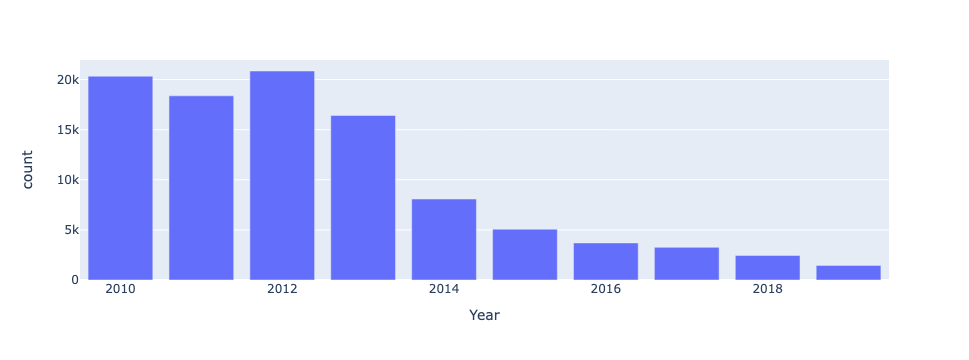

In [15]:
fig = px.bar(arrests_grouped,
       x='Year',
       y='count')

fig.show()

This plot led us to find that there was a significant decline in these types of arrests after 2012, continuing through 2019.

## Plotted data by arrest type

Then grouped the data by charge description to see which type was most common.

In [16]:
arrests_grouped_2 = arrest_df.value_counts(['chrg_desc']).reset_index(name='count')

In [17]:
arrests_grouped_2

,chrg_desc,count
0,DRINKING IN PUBLIC,93916
1,ILLEGAL STREET/SIDEWALK SALES,4228
2,OPEN ALCOHOLIC BEV IN PUBLIC PARK/PLACE,1848
3,ILLEGAL SALES - FREEWAY RAMPS,6
4,IMPEDING NORMAL FLOW OF TRAFFIC,2


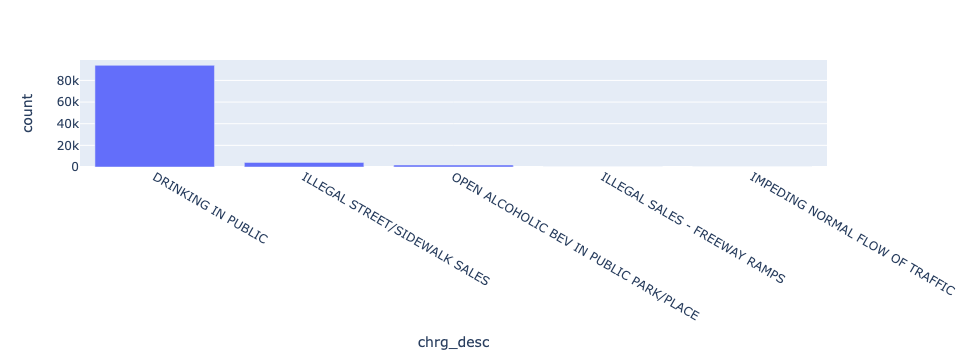

In [18]:
fig = px.bar(arrests_grouped_2,
       x='chrg_desc',
       y='count')

fig.show()

This revealed that the vast majority of the arrests were for drinking in public. 

## Created a new dataframe that is a subset of the arrest data including information for the six neighborhoods of interest
We selected neighborhoods in three different categories (as categorized by the Urban Displacement Project):
1) Low Income/ Susceptible to Displacement (Lincoln Heights, Jefferson Park)
2) High Displacement Risk (Boyle Heights, Westlake)
3) Stable Moderate/Mixed Income (Fairfax, Los Feliz)

First, created lists of all the LAPD reporting districts for each neighborhood.
 

First created a list of all the reporting districts in each neighborhood (those are hidden below).

In [19]:
lincoln_heights_rd = ['0423', 
                      '0424', 
                      '0422', 
                      '0415', 
                      '0417', 
                      '0416', 
                      '0414', 
                      '0413', 
                      '0412', 
                      '0401', 
                      '0402',
                      '0403', 
                      '0407']


In [20]:
fairfax_rd = ['0701',
              '0711',
              '0722',
              '0723',
              '0732',
              '0702',
              '0713',
              '0724',
              '0734',
              '0733',
              '0735',
              '0736',
              '0725',
              '0726',
              '0714',
              '0715',
              '0705',
              '0706',
              '0717',
              '0727',
              '0737',
              '0738',
              '0739',
              '0729',
              '0719']



In [21]:
boyle_heights_rd = ['0449',
                    '0455',
                    '0453',
                    '0452',
                    '0454',
                    '0463',
                    '0464',
                    '0462',
                    '0437',
                    '0456',
                    '0457',
                    '0466',
                    '0467',
                    '0477',
                    '0487',
                    '0489',
                    '0497',
                    '0499',
                    '0479',
                    '0459',
                    '0469',
                    '0478',
                    '0488',
                    '0459',
                    '0448',
                    '0468',
                    '0465']


In [22]:
los_feliz_rd = ['1153',
                '1141',
                '1151',
                '1161',
                '1163',
                '1162',
                '1142',
                '1152',
                '1143',
                '1132',
                '1122',
                '1144',
                '1171']


In [23]:
jefferson_park_rd = ['0309',
                     '0319',
                     '0329',
                     '0308',
                     '0318',
                     '0327',
                     '0325',
                     '0338',
                     '0317',
                     '0337',
                     '0326',
                     '0316',
                     '0336',
                     '0316',
                     '0315',
                     '0335',
                     '0314',
                     '0313',
                     '0334',
                     '0333',
                     '0307',
                     '0305',
                     '0332',
                     '0331']


In [24]:
westlake_rd = ['0231',
               '0233',
               '0235',
               '0236',
               '0237',
               '0241',
               '0238',
               '0251',
               '0245',
               '0239',
               '0246',
               '0247',
               '0248',
               '0261',
               '0257',
               '0256',
               '0271',
               '0265',
               '0266',
               '0275',
               '0269',
               '0281',
               '0279',
               '0285',
               '0289',
               '0291',
               '0295',
               '0299',
               '0291']


### Created a new neighborhood column and labled the neighborhoods based on the reporting district data.

Using the df.loc command added a neighborhood column to the data and filled it in with the correct neighborhood for each row based on the reporting district lists created above.

In [25]:
arrest_df.loc[arrest_df['rd'].isin(lincoln_heights_rd), 'neighborhood'] = 'Lincoln Heights'
arrest_df.loc[arrest_df['rd'].isin(boyle_heights_rd), 'neighborhood'] = 'Boyle Heights'
arrest_df.loc[arrest_df['rd'].isin(fairfax_rd), 'neighborhood'] = 'Fairfax'
arrest_df.loc[arrest_df['rd'].isin(westlake_rd), 'neighborhood'] = 'Westlake'
arrest_df.loc[arrest_df['rd'].isin(jefferson_park_rd), 'neighborhood'] = 'Jefferson Park'
arrest_df.loc[arrest_df['rd'].isin(los_feliz_rd), 'neighborhood'] = 'Los Feliz'

Then counted the number of arrests by neighborhood

In [26]:
arrest_df['neighborhood'].value_counts()

Westlake           7117
Jefferson Park     2370
Los Feliz          1666
Boyle Heights      1527
Lincoln Heights     746
Fairfax             720
Name: neighborhood, dtype: int64

### Created a dataframe that just included the rows that are in the three neighborhoods of interest

Next created a new dataframe that just included arrests in the neighborhoods we are studying by creating a list of all the neighborhoods and then defining a new dataframe called arrests_df_nh that just keeps all the records where the neighorhood is defined to be one of the six we are studying. 

In [27]:
nh = ['Lincoln Heights', 'Boyle Heights', 'Fairfax', 'Westlake', 'Jefferson Park', 'Los Feliz']

In [28]:
arrest_df_nh = arrest_df.loc[arrest_df['neighborhood'].isin(nh)]

In [29]:
arrest_df_nh['neighborhood'].value_counts()

Westlake           7117
Jefferson Park     2370
Los Feliz          1666
Boyle Heights      1527
Lincoln Heights     746
Fairfax             720
Name: neighborhood, dtype: int64

In [30]:
arrest_df_nh.sample(2)

,arst_date,rd,chrg_desc,location_1,lat,lon,Year,neighborhood
54777,2013-06-16,0245,DRINKING IN PUBLIC,"{'type': 'Point', 'coordinates': [-118.278, 34...",34.0609,-118.278,2013,Westlake
16960,2011-07-27,0333,DRINKING IN PUBLIC,"{'type': 'Point', 'coordinates': [-118.3351, 3...",34.0256,-118.3351,2011,Jefferson Park


Printed a sample of 2 and ran this code several times to ensure the neighborhood category is defined for the data in this new dataframe

## Grouped the data by year and neighborhood

Created a new dataframe that grouped the data by neighborhood and year and printed a sample of 5 to ensure the data was structued properly

In [31]:
arrests_grouped = arrest_df_nh.value_counts(['neighborhood','Year']).reset_index(name='count')

In [32]:
arrests_grouped.sample(5)

,neighborhood,Year,count
50,Fairfax,2018,5
45,Lincoln Heights,2017,19
32,Lincoln Heights,2010,123
48,Los Feliz,2018,15
15,Los Feliz,2014,305


## Charted the arrest data by year and neighborhood

Using plotly, plotted the data by year seperated by neighborhood.

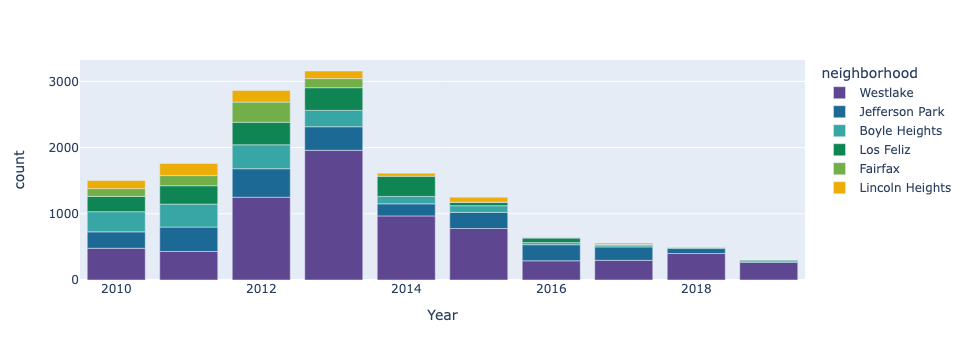

In [33]:
fig = px.bar(arrests_grouped,
       x='Year',
       y='count', 
       color = 'neighborhood',
       color_discrete_sequence= px.colors.qualitative.Prism)

fig.show()

Similarly to the citywide data, here we see that this type of arrest become much less common after 2012. Based on this finding as a next step we will look into if there were any policy changes in 2012 that could account for this trend.

## Mapped the arrest types in each neighborhood

First, renamed the charge description data so the map was more legible

In [34]:
arrest_df_nh.rename(columns={'chrg_desc': 'Charge Description'}, inplace=True)

/tmp/ipykernel_362/3579052792.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Then checked the data types and change the lat long variables into floats so they could be mapped

In [35]:
arrest_df_nh.dtypes

arst_date             datetime64[ns]
rd                            object
Charge Description            object
location_1                    object
lat                           object
lon                           object
Year                           int64
neighborhood                  object
dtype: object

In [36]:
arrest_df_nh['lat'] = arrest_df_nh['lat'].astype(float)
arrest_df_nh['lon'] = arrest_df_nh['lon'].astype(float)

/tmp/ipykernel_362/3736439519.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_362/3736439519.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Then using plotly mapped the arrests by type, as we found above the most common type was drinking in public in Westlake. This also shows that almost all of the vending citations were issued in westlake.

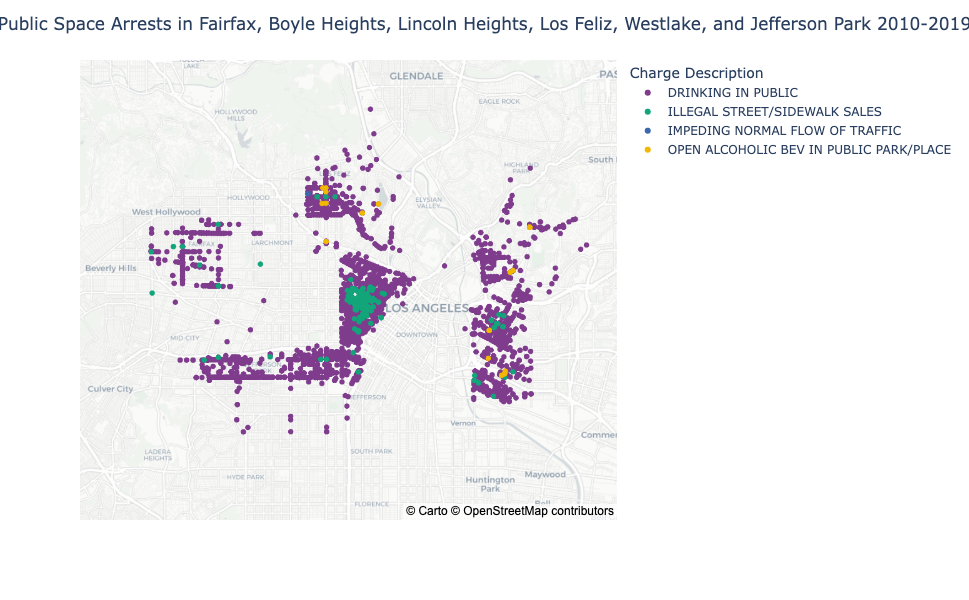

In [37]:
fig = px.scatter_mapbox(arrest_df_nh,
                        lat='lat',
                        lon='lon',
                        zoom=10.5,
                        color='Charge Description',
                        hover_data=['Year','neighborhood'],
                        mapbox_style="carto-positron",
                        color_discrete_sequence = px.colors.qualitative.Bold,
                        center=dict(
                            lat=34.060695018239,
                            lon=-118.28083936452524)
                       )

fig.update_layout(
    width = 1000,
    height = 600,
    title = "Public Space Arrests in Fairfax, Boyle Heights, Lincoln Heights, Los Feliz, Westlake, and Jefferson Park 2010-2019",
    title_x=0.5
    
)

fig.show()

Created a second map to show arrests by year spatially. 

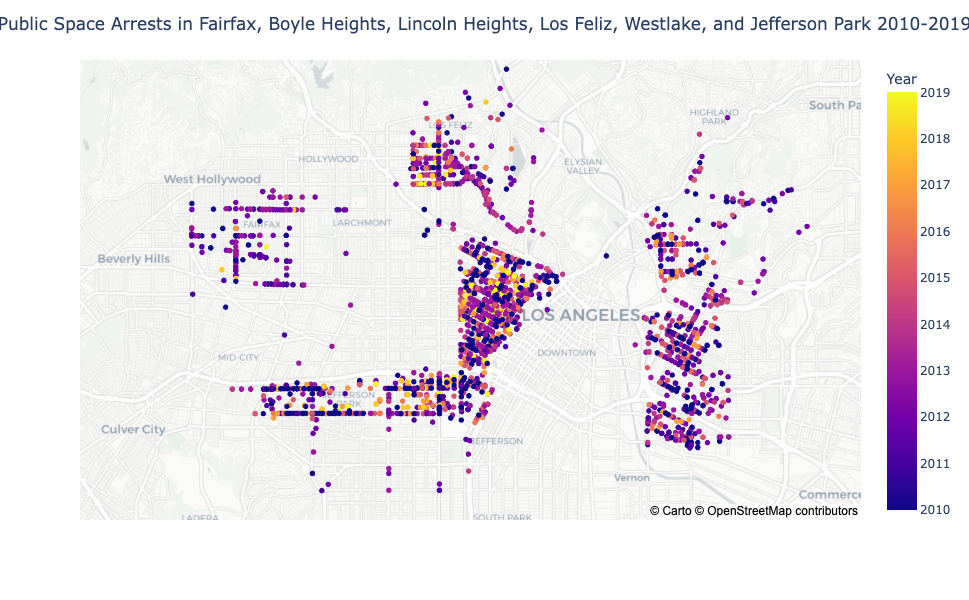

In [38]:
fig = px.scatter_mapbox(arrest_df_nh,
                        lat='lat',
                        lon='lon',
                        zoom=11,
                        color='Year',
                        hover_data=['Year','neighborhood'],
                        mapbox_style="carto-positron",
                        center=dict(
                            lat=34.060695018239,
                            lon=-118.28083936452524)
                       )

fig.update_layout(
    width = 1000,
    height = 600,
    title = "Public Space Arrests in Fairfax, Boyle Heights, Lincoln Heights, Los Feliz, Westlake, and Jefferson Park 2010-2019",
    title_x=0.5
)

fig.show()

Finally, created a map to show the arrests by neighborhood. This shows that some of the arrests fall outside of the neighborhood. We interpreted this to mean that some of the data has been miscateogrized into reporting districts where the arrests did not actually take place. The data notes that because the arrests are recorded on paper sometimes and then input into a digital system there can be some errors which is what we see here.

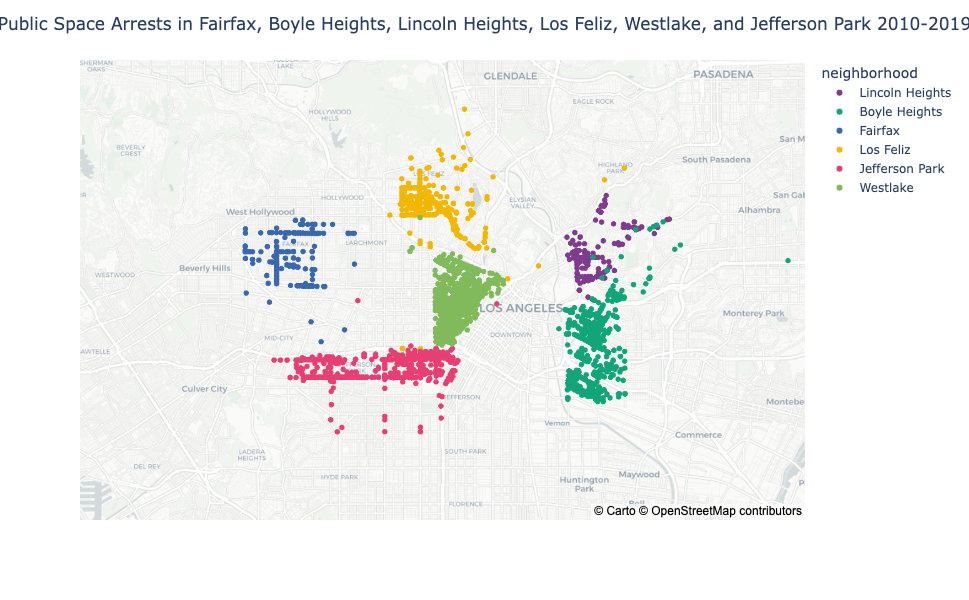

In [39]:
fig = px.scatter_mapbox(arrest_df_nh,
                        lat='lat',
                        lon='lon',
                        zoom=10.5,
                        color='neighborhood',
                        hover_data=['Year','Charge Description'],
                        mapbox_style="carto-positron",
                        color_discrete_sequence = px.colors.qualitative.Bold,
                        center=dict(
                            lat=34.060695018239,
                            lon=-118.28083936452524)
                       )

fig.update_layout(
    width = 1000,
    height = 600,
    title = "Public Space Arrests in Fairfax, Boyle Heights, Lincoln Heights, Los Feliz, Westlake, and Jefferson Park 2010-2019",
    title_x=0.5
    
)

fig.show()